In [1]:
import wave
import numpy as np
import matplotlib.pyplot as plt
from pylab import *

%matplotlib inline

In [208]:
def wav2data(wf):
    buf = wf.readframes(wf.getnframes())
    data = np.frombuffer(buf, dtype="int16")
    return data


def downsampling(conversion_rate,data,fs):
    """
    ダウンサンプリングを行う．
    入力として，変換レートとデータとサンプリング周波数．
    ダウンサンプリング後のデータとサンプリング周波数を返す．
    """
    # 間引くサンプル数を決める
    decimationSampleNum = conversion_rate-1

    # FIRフィルタの用意をする
    nyqF = fs/2.0             # 変換後のナイキスト周波数
    cF = (fs/conversion_rate/2.0-500.)/nyqF     # カットオフ周波数を設定（変換前のナイキスト周波数より少し下を設定）
    taps = 511                                  # フィルタ係数（奇数じゃないとだめ）
    b = scipy.signal.firwin(taps, cF)           # LPFを用意

    #フィルタリング
    # data = scipy.signal.lfilter(b,1,data)

    #間引き処理
    downData = []
    for i in range(0,len(data),decimationSampleNum+1):
        downData.append(data[i])

    return np.array(downData)


def voice_trimming(data):    
    data = frombuffer(data, dtype="int16")
    
    threshold = 10000
    data[data>threshold]
    
    voices = np.where(np.absolute(data)>threshold)
    start_index = voices[0][0]
    end_index = voices[0][len(voices[0])-1]
    trimmed_data = data[start_index:end_index]
    return trimmed_data


def data_normalize(trimmed_data, axis=None):
    min = trimmed_data.min(axis=axis, keepdims=True)
    max = trimmed_data.max(axis=axis, keepdims=True)
    norm_data = (trimmed_data-min)/(max-min)
    return norm_data
    
    
def zscore(trimmed_data, axis = None):
    xmean = trimmed_data.mean(axis=axis, keepdims=True)
    xstd  = np.std(trimmed_data, axis=axis, keepdims=True)
    zscore = (trimmed_data-xmean)/xstd
    return zscore
    

def calc_pecgram(wf, voice_type): 
    data = wav2data(wf)
    trimmed_data = voice_trimming(data)
    if voice_type == 'pokemon':
        zscore_data = zscore(trimmed_data, axis = None)
    else:
        downsampled_data = downsampling(2,trimmed_data,48000)
        zscore_data = zscore(downsampled_data, axis = None)
        

    # FFTのサンプル数 ハイパラ
    N = 8192
    
    # FFTで用いるハミング窓
    hammingWindow = np.hamming(N)

    # スペクトログラムを描画
    pxx, freqs, bins, im = specgram(zscore_data, NFFT=N, Fs=len(zscore_data), noverlap=0, window=hammingWindow)
    
    return (pxx, freqs, bins, im)

def append_zero(vec):
    max_len = 4
    if len(vec) != max_len:
        append = np.zeros(max_len - len(vec))
        extended_vec = np.append(vec, append)
    else: extended_vec = vec
    return extended_vec

def cos_sim(v1, v2):
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

## 数値化

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7609: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


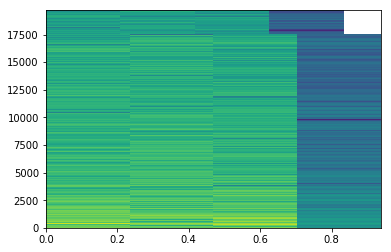

In [216]:
# voice1
wf_voice1 = wave.open("voice1.wav" , "r" )
specgram_voice1 = calc_pecgram(wf_voice1, "person")
matcrix_voice1 = specgram_voice1[0]

vec_1 = np.amax(matcrix_voice1, axis=0)
ex_1 = append_zero(vec_1)

# フシギダネ
wf_f = wave.open("001.wav" , "r" )
specgram_f = calc_pecgram(wf_f, "pokemon")
matcrix_f = specgram_f[0]

vec_f = np.amax(matcrix_f, axis=0)
ex_f = append_zero(vec_f)

# リザードン
wf_l = wave.open("006.wav" , "r" )
specgram_l = calc_pecgram(wf_l, "pokemon")
matcrix_l = specgram_l[0]

vec_l = np.amax(matcrix_l, axis=0)
ex_l = append_zero(vec_l)

# サイホーン
wf_s = wave.open("111.wav" , "r" )
specgram_s = calc_pecgram(wf_s, "pokemon")
matcrix_s = specgram_s[0]

vec_s = np.amax(matcrix_s, axis=0)
ex_s = append_zero(vec_s)

In [221]:
print("サイホーンとリザードンの類似度は {} ".format(cos_sim(ex_s, ex_l)))
print("フシギダネとリザードンの類似度は {} ".format(cos_sim(ex_f, ex_l)))
print("Voice1とリザードンの類似度は {} ".format(cos_sim(ex_1, ex_l)))

サイホーンとリザードンの類似度は 0.9596522826010007 
フシギダネとリザードンの類似度は 0.9967477347217366 
Voice1とリザードンの類似度は 0.6525344640530143 


## まとめ

### 音源の確認

In [225]:
wf_fushigidane = wave.open("001.wav" , "r" )
wf_lizardon = wave.open("006.wav" , "r" )
wf_saihone= wave.open("111.wav" , "r" )

wf_voice1 = wave.open("voice1.wav" , "r" )
wf_voice2 = wave.open("voice2.wav" , "r" )
wf_voice3 = wave.open("voice3.wav" , "r" )
wf_voice4 = wave.open("voice4.wav" , "r" )


print("フシギバナ")
data_f = wav2array(wf_fushigidane)

print("リザードン")
data_l = wav2array(wf_lizardon)

print("サイホーン")
data_s = wav2array(wf_saihone)

print("voice1")
data_voice1 = wav2array(wf_voice1)

print("voice2")
data_voice2 = wav2array(wf_voice2)

print("voice3")
data_voice3 = wav2array(wf_voice3)

print("voice4")
data_voice4 = wav2array(wf_voice4)

フシギバナ
チャンネル数: 2
サンプル幅: 1
サンプリング周波数: 22050
フレーム数: 34960
パラメータ: _wave_params(nchannels=2, sampwidth=1, framerate=22050, nframes=34960, comptype='NONE', compname='not compressed')
長さ（秒）: 1.5854875283446712
リザードン
チャンネル数: 2
サンプル幅: 1
サンプリング周波数: 22050
フレーム数: 39376
パラメータ: _wave_params(nchannels=2, sampwidth=1, framerate=22050, nframes=39376, comptype='NONE', compname='not compressed')
長さ（秒）: 1.7857596371882085
サイホーン
チャンネル数: 2
サンプル幅: 1
サンプリング周波数: 22050
フレーム数: 34960
パラメータ: _wave_params(nchannels=2, sampwidth=1, framerate=22050, nframes=34960, comptype='NONE', compname='not compressed')
長さ（秒）: 1.5854875283446712
voice1
チャンネル数: 1
サンプル幅: 2
サンプリング周波数: 48000
フレーム数: 129600
パラメータ: _wave_params(nchannels=1, sampwidth=2, framerate=48000, nframes=129600, comptype='NONE', compname='not compressed')
長さ（秒）: 2.7
voice2
チャンネル数: 1
サンプル幅: 2
サンプリング周波数: 48000
フレーム数: 148800
パラメータ: _wave_params(nchannels=1, sampwidth=2, framerate=48000, nframes=148800, comptype='NONE', compname='not compressed')
長さ（秒）: 3.1
voice3
チャ

### waveの可視化

フシギダネ


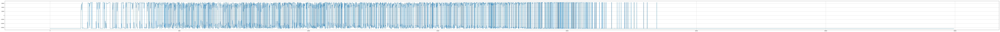

リザードン


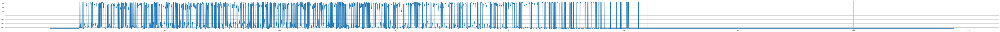

サイホーン


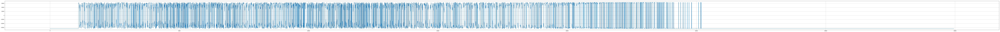

voice1


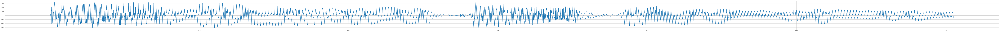

voice2


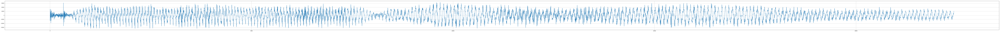

voice3


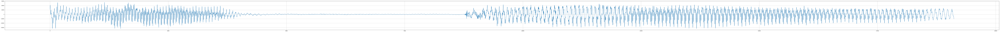

voice4


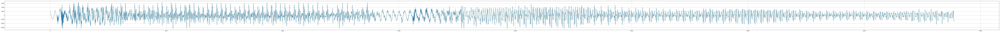

In [228]:
def wav2array(wf):
    """WAVEファイルの情報を取得"""
    print("チャンネル数:", wf.getnchannels())
    print("サンプル幅:", wf.getsampwidth())
    print("サンプリング周波数:", wf.getframerate())
    print("フレーム数:", wf.getnframes())
    print("パラメータ:", wf.getparams())
    print("長さ（秒）:", float(wf.getnframes()) / wf.getframerate())
    
     # こいつbuffer
    buf = wf.readframes(wf.getnframes())
    data = np.frombuffer(buf, dtype="int16")
    
    return data

wf_f = wave.open("001.wav" , "r" )
wf_l = wave.open("006.wav" , "r" )
wf_s = wave.open("111.wav" , "r" )

wf_voice1 = wave.open("voice1.wav" , "r" )
wf_voice2 = wave.open("voice2.wav" , "r" )
wf_voice3 = wave.open("voice3.wav" , "r" )
wf_voice4 = wave.open("voice4.wav" , "r" )


print("フシギダネ")
plt.figure(figsize=(200,6))
plt.plot(data_f)
plt.grid()
plt.show()

print("リザードン")
plt.figure(figsize=(200,6))
plt.plot(data_l)
plt.grid()
plt.show()

print("サイホーン")
plt.figure(figsize=(200,6))
plt.plot(data_s)
plt.grid()
plt.show()

print("voice1")
plt.figure(figsize=(200,6))
plt.plot(input_voice1)
plt.grid()
plt.show()

print("voice2")
plt.figure(figsize=(200,6))
plt.plot(input_voice2)
plt.grid()
plt.show()

print("voice3")
plt.figure(figsize=(200,6))
plt.plot(input_voice3)
plt.grid()
plt.show()

print("voice4")
plt.figure(figsize=(200,6))
plt.plot(input_voice4)
plt.grid()
plt.show()

## voice1 の標準化

voice1


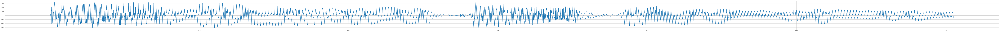

down data


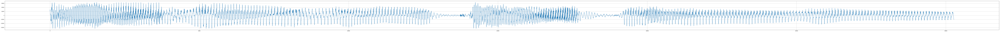

nomralizead


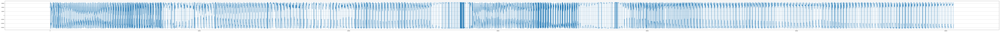

zscore


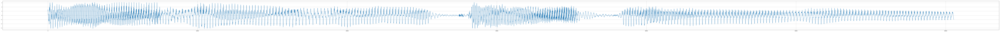

In [229]:
wf_voice1 = wave.open("voice1.wav" , "r")
data_voice1 = wav2data(wf_voice1)
trimmed_voice1 = voice_trimming(data_voice1)
downsampled_data = downsampling(2,trimmed_voice1,48000)
normed_voice1 = data_normalize(trimmed_voice1, axis=None)
zscore_voice1 = zscore(trimmed_voice1, axis = None)

print("voice1")
plt.figure(figsize=(200,6))
plt.plot(trimmed_voice1)
plt.grid()
plt.show()

print("down data")
plt.figure(figsize=(200,6))
plt.plot(downsampled_data)
plt.grid()
plt.show()

print("nomralizead")
plt.figure(figsize=(200,6))
plt.plot(normed_voice1)
plt.grid()
plt.show()

print("zscore")
plt.figure(figsize=(200,6))
plt.plot(zscore_voice1)
plt.grid()
plt.show()

## フシギダネ

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7609: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


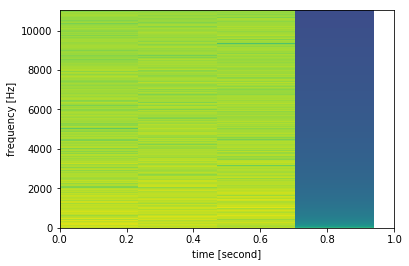

In [231]:
wf_f = wave.open("001.wav" , "r" )
specgram_f = calc_pecgram(wf_f, "pokemon")
matcrix_f = specgram_f[0]
drawspecgram(specgram_f)

## リザードン

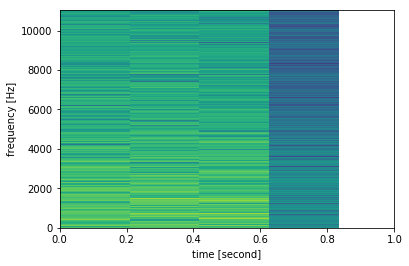

In [232]:
wf_l = wave.open("006.wav" , "r" )
specgram_l = calc_pecgram(wf_l, "pokemon")
matcrix_l = specgram_l[0]
drawspecgram(specgram_f)

## サイホーン

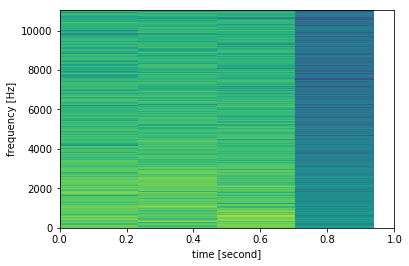

In [234]:
wf_s = wave.open("111.wav" , "r" )
specgram_s = calc_pecgram(wf_s, "pokemon")
matcrix_s = specgram_s[0]
drawspecgram(specgram_s)

## 人の声

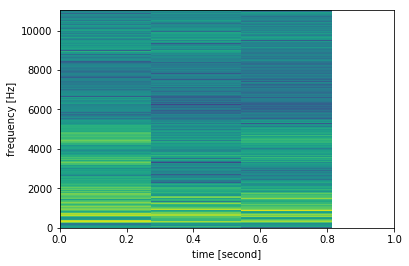

In [235]:
wf_s = wave.open("voice1.wav" , "r" )
specgram_s = calc_pecgram(wf_s, "person")
matcrix_s = specgram_s[0]
drawspecgram(specgram_s)